Γεώργιος Λεβαντής<br>
mpked2216<br>
<br>
In this project, I analyzed 3 datasets containing Airbnb apartment information about Cape Town, South Africa. I explored the data, handled missing values, created additional dataframes, and generated insightful visualizations.
<br>
<br>
Key Highlights:
<br>
<br>
Explored the initial datasets to understand theirs structure and contents.<br>
Handled missing values by filling them with appropriate substitutes.<br>
Created additional dataframes to extract more insights, such as mean and median prices by category and neighborhood.<br>
Generated informative visualizations, including box plots, bar plots, heatmaps, and choropleth map.<br>
Discovered trends and correlations between property types, prices, bedrooms, and neighborhoods.<br>
Presented valuable information for individuals interested in Airbnb apartment rentals in Cape Town, South Africa.


In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
import folium
import matplotlib.pyplot as plt
import geopandas as geopd
import seaborn as sns

calendar = "/Users/levantisgio/Desktop/ProjectsUnipi/2nd_Semester/Choices/Visual_Analytics/Project1/flat_files/calendar.csv"
listings = "/Users/levantisgio/Desktop/ProjectsUnipi/2nd_Semester/Choices/Visual_Analytics/Project1/flat_files/listings.csv"
ward_geo = "/Users/levantisgio/Desktop/ProjectsUnipi/2nd_Semester/Choices/Visual_Analytics/Project1/flat_files/neighbourhoods.geojson"

In [2]:
# Read the .csv files and store it as a pandas Data Frames
calendar = pd.read_csv(calendar)
listings = pd.read_csv(listings)
ward_geo = geopd.read_file(ward_geo)

### Understanding the Datasets

The following methods provide valuable information about the data structure, 
summary statistics, data types and quality of the datasets i will use 
to perform further data manipulation and analysis.
The datasets i am going to use are Calendar, Listings and Ward Geo.

#### Listings dataset

In [3]:
listings

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3191,https://www.airbnb.com/rooms/3191,20230329174558,2023-03-30,city scrape,Malleson Garden Cottage,"This is a lovely, separate, self-catering cott...","Mowbray is on the Southern Suburbs line, 6km (...",https://a0.muscache.com/pictures/697022/385407...,3754,https://www.airbnb.com/users/show/3754,Brigitte,2008-10-21,"Cape Town, South Africa",I'm single and love to travel and meeting peop...,within an hour,100%,100%,f,https://a0.muscache.com/im/users/3754/profile_...,https://a0.muscache.com/im/users/3754/profile_...,NaN,1,2,"['email', 'phone', 'work_email']",t,t,"Southern Suburbs, Western Cape, South Africa",Ward 57,NaN,-33.947390,18.476000,Entire home,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Essentials"", ""Kitchen"", ""Washer"", ""Dishes an...",$671.00,3,730,3.0,3.0,730.0,730.0,3.0,730.0,NaN,t,15,29,59,304,2023-03-30,73,10,1,2013-05-31,2023-03-11,4.80,4.82,4.67,4.97,4.96,4.75,4.80,NaN,t,1,1,0,0,0.61
1,1048451,https://www.airbnb.com/rooms/1048451,20230329174558,2023-03-30,city scrape,Beautiful Beach Flat,<b>The space</b><br />A lovely beach flat in C...,NaN,https://a0.muscache.com/pictures/15763616/823e...,5589045,https://www.airbnb.com/users/show/5589045,Shereeze,2013-03-23,"London, United Kingdom",I have done a lot of travelling and seen the w...,a few days or more,0%,0%,f,https://a0.muscache.com/im/users/5589045/profi...,https://a0.muscache.com/im/users/5589045/profi...,NaN,1,1,"['email', 'phone']",t,t,NaN,Ward 107,NaN,-33.823120,18.477780,Entire rental unit,Entire home/apt,2,NaN,NaN,1.0,NaN,[],"$1,341.00",3,60,3.0,3.0,60.0,60.0,3.0,60.0,NaN,t,30,60,90,365,2023-03-30,1,0,0,2014-01-04,2014-01-04,5.00,5.00,4.00,5.00,5.00,5.00,4.00,NaN,f,1,1,0,0,0.01
2,15007,https://www.airbnb.com/rooms/15007,20230329174558,2023-03-30,city scrape,Blaauwberg House (now with inverter),Welcome to our self-catering beach-front famil...,"Bloubergstrand is a lovely, cosy suburb near C...",https://a0.muscache.com/pictures/3b654aa4-248e...,59072,https://www.airbnb.com/users/show/59072,Dirk,2009-12-01,"Cape Town, South Africa",Proud to live in the beautiful city of Cape To...,within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/86c72...,https://a0.muscache.com/im/pictures/user/86c72...,NaN,4,13,"['email', 'phone', 'work_email']",t,t,"Cape Town, Western Cape, South Africa",Ward 23,NaN,-33.800010,18.460630,Entire home,Entire home/apt,6,NaN,3 baths,3.0,4.0,"[""Barbecue utensils"", ""Essentials"", ""Refrigera...","$3,827.00",2,120,2.0,2.0,1125.0,1125.0,2.0,1125.0,NaN,t,16,46,76,330,2023-03-30,42,6,0,2013-12-15,2023-01-10,4.83,4.93,4.90,5.00,4.95,4.95,4.85,NaN,f,3,3,0,0,0.37
3,473856,https://www.airbnb.com/rooms/473856,20230329174558,2023-0

In [4]:
listings.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,1.975100e+04,1.975100e+04,1.975100e+04,19751.000000,19751.000000,0.0,19751.000000,19751.000000,19751.000000,0.0,18604.000000,19474.000000,19751.000000,1.975100e+04,19739.000000,19739.000000,1.973900e+04,1.973900e+04,19739.000000,1.973900e+04,0.0,19751.000000,19751.000000,19751.000000,19751.000000,19751.000000,19751.000000,19751.000000,15780.000000,15671.000000,15672.000000,15667.000000,15671.000000,15668.000000,15668.000000,19751.000000,19751.000000,19751.00000,19751.000000,15780.000000
mean,2.229289e+17,2.023033e+13,1.508505e+08,13.263835,18.741583,NaN,-33.959584,18.475094,3.813174,NaN,1.986240,2.363767,4.419776,1.117595e+03,4.199200,5.381529,1.235537e+03,1.250426e+03,4.547500,1.245183e+03,NaN,13.322819,33.197509,54.942535,220.622095,22.260240,6.617133,0.702344,4.701640,4.761341,4.745398,4.807803,4.808234,4.798352,4.691300,10.559617,9.479672,0.99438,0.015949,0.967079
std,3.373404e+17,7.007990e+00,1.513166e+08,42.989720,78.115585,NaN,0.100802,0.128823,2.445089,NaN,1.373498,1.849288,16.051299,7.115234e+04,15.850372,16.507102,7.117291e+04,7.117277e+04,16.057711,7.117281e+04,NaN,11.144982,21.726114,32.301704,125.075768,41.666951,11.133593,1.324990,0.583288,0.451501,0.446096,0.430353,0.443206,0.387502,0.473342,22.510388,22.013995,2.42911,0.189867,1.120480
min,3.191000e+03,2.023033e+13,3.754000e+03,1.000000,1.000000,NaN,-34.264400,18.319410,1.000000,NaN,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.010000
25%,2.120056e+07,2.023033e+13,2.821756e+07,1.000000,1.000000,NaN,-34.023655,18.401560,2.000000,NaN,1.000000,1.000000,2.000000,9.000000e+01,1.000000,2.000000,3.650000e+02,3.650000e+02,2.000000,3.650000e+02,NaN,0.000000,12.000000,27.000000,109.000000,1.000000,0.000000,0.000000,4.670000,4.720000,4.670000,4.800000,4.800000,4.757500,4.620000,1.000000,1.000000,0.00000,0.000000,0.210000
50%,4.163143e+07,2.023033e+13,8.814229e+07,2.000000,3.000000,NaN,-33.929710,18.427918,3.000000,NaN,2.000000,2.000000,2.000000,3.650000e+02,2.000000,3.000000,1.125000e+03,1.125000e+03,2.100000,1.125000e+03,NaN,13.000000,38.000000,66.000000,252.000000,6.000000,2.000000,0.000000,4.870000,4.900000,4.890000,4.950000,4.960000,4.920000,4.820000,2.000000,1.000000,0.00000,0.000000,0.590000
75%,6.301989e+17,2.023033e+13,2.434973e+08,8.000000,10.000000,NaN,-33.910490,18.482769,5.000000,NaN,3.000000,3.000000,4.000000,1.125000e+03,3.000000,5.000000,1.125000e+03,1.125000e+03,4.000000,1.125000e+03,NaN,24.000000,53.000000,83.000000,338.000000,24.000000,8.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,7.000000,4.000000,1.00000,0.000000,1.340000
max,8.576426e+17,2.023033e+13,5.072788e+08,2432.000000,5180.000000,NaN,-33.551770,18.930557,16.000000,NaN,41.000000,50.000000,999.000000,1.000000e+07,999.000000,999.000000,1.000000e+07,1.000000e+07,999.000000,1.000000e+07,NaN,30.000000,60.000000,90.000000,365.000000,655.000000,212.000000,26.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,137.000000,130.00

In [5]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19751 entries, 0 to 19750
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            19751 non-null  int64  
 1   listing_url                                   19751 non-null  object 
 2   scrape_id                                     19751 non-null  int64  
 3   last_scraped                                  19751 non-null  object 
 4   source                                        19751 non-null  object 
 5   name                                          19751 non-null  object 
 6   description                                   19496 non-null  object 
 7   neighborhood_overview                         12736 non-null  object 
 8   picture_url                                   19751 non-null  object 
 9   host_id                                       19751 non-null 

In [6]:
listings.head(2)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3191,https://www.airbnb.com/rooms/3191,20230329174558,2023-03-30,city scrape,Malleson Garden Cottage,"This is a lovely, separate, self-catering cott...","Mowbray is on the Southern Suburbs line, 6km (...",https://a0.muscache.com/pictures/697022/385407...,3754,https://www.airbnb.com/users/show/3754,Brigitte,2008-10-21,"Cape Town, South Africa",I'm single and love to travel and meeting peop...,within an hour,100%,100%,f,https://a0.muscache.com/im/users/3754/profile_...,https://a0.muscache.com/im/users/3754/profile_...,NaN,1,2,"['email', 'phone', 'work_email']",t,t,"Southern Suburbs, Western Cape, South Africa",Ward 57,NaN,-33.94739,18.47600,Entire home,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Essentials"", ""Kitchen"", ""Washer"", ""Dishes an...",$671.00,3,730,3.0,3.0,730.0,730.0,3.0,730.0,NaN,t,15,29,59,304,2023-03-30,73,10,1,2013-05-31,2023-03-11,4.8,4.82,4.67,4.97,4.96,4.75,4.8,NaN,t,1,1,0,0,0.61
1,1048451,https://www.airbnb.com/rooms/1048451,20230329174558,2023-03-30,city scrape,Beautiful Beach Flat,<b>The space</b><br />A lovely beach flat in C...,NaN,https://a0.muscache.com/pictures/15763616/823e...,5589045,https://www.airbnb.com/users/show/5589045,Shereeze,2013-03-23,"London, United Kingdom",I have done a lot of travelling and seen the w...,a few days or more,0%,0%,f,https://a0.muscache.com/im/users/5589045/profi...,https://a0.muscache.com/im/users/5589045/profi...,NaN,1,1,"['email', 'phone']",t,t,NaN,Ward 107,NaN,-33.82312,18.47778,Entire rental unit,Entire home/apt,2,NaN,NaN,1.0,NaN,[],"$1,341.00",3,60,3.0,3.0,60.0,60.0,3.0,60.0,NaN,t,30,60,90,365,2023-03-30,1,0,0,2014-01-04,2014-01-04,5.0,5.00,4.00,5.00,5.00,5.00,4.0,NaN,f,1,1,0,0,0.01


In [7]:
listings.tail(2)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
19749,857118666957317725,https://www.airbnb.com/rooms/857118666957317725,20230329174558,2023-03-30,city scrape,Serene and cozy cottage,Welcome to our beautiful and cozy cottage in t...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,255727382,https://www.airbnb.com/users/show/255727382,Celso,2019-04-14,"Cape Town, South Africa",I am a superhost and founder of the Comfy stay...,within an hour,100%,95%,t,https://a0.muscache.com/im/pictures/user/4138d...,https://a0.muscache.com/im/pictures/user/4138d...,NaN,12,13,"['email', 'phone']",t,t,NaN,Ward 62,NaN,-34.022810,18.439219,Entire guesthouse,Entire home/apt,1,NaN,1 bath,1.0,1.0,"[""TV"", ""Building staff"", ""Wifi"", ""Outdoor dini...",$564.00,28,1125,28.0,28.0,1125.0,1125.0,28.0,1125.0,NaN,t,30,60,90,365,2023-03-30,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,12,12,0,0,NaN
19750,857130313334379065,https://www.airbnb.com/rooms/857130313334379065,20230329174558,2023-03-29,city scrape,Apartment in the Mountains,"Between the mountains and the ocean, on the ed...",Friendly little town with a great bay and easy...,https://a0.muscache.com/pictures/miso/Hosting-...,62961217,https://www.airbnb.com/users/show/62961217,Faheem,2016-03-14,"Rome, Italy",NaN,NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/8833a...,https://a0.muscache.com/im/pictures/user/8833a...,NaN,1,1,"['email', 'phone']",t,t,"Cape Town, Western Cape, South Africa",Ward 100,NaN,-34.154076,18.888199,Entire rental unit,Entire home/apt,3,NaN,1 bath,2.0,2.0,"[""Kitchen"", ""Washer"", ""City skyline view"", ""Be...",$455.00,2,1125,2.0,2.0,1125.0,1125.0,2.0,1125.0,NaN,t,16,43,73,348,2023-03-29,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN


In [8]:
listings.shape
#(Rows,Columns)

(19751, 75)

In [9]:
listings.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19751 entries, 0 to 19750
Columns: 75 entries, id to reviews_per_month
dtypes: float64(21), int64(19), object(35)
memory usage: 11.3+ MB


In [10]:
listings.isnull().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
source                                             0
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               3971
Length: 75, dtype: int64

In [11]:
null_count = listings.isnull().sum().sum()
print("Total number of null values:", null_count)
#176.866 nulls

Total number of null values: 176866


In [12]:
missing_percentage_l = (listings.isnull().sum() / len(listings)) * 100
missing_percentage_l

id                                               0.000000
listing_url                                      0.000000
scrape_id                                        0.000000
last_scraped                                     0.000000
source                                           0.000000
                                                  ...    
calculated_host_listings_count                   0.000000
calculated_host_listings_count_entire_homes      0.000000
calculated_host_listings_count_private_rooms     0.000000
calculated_host_listings_count_shared_rooms      0.000000
reviews_per_month                               20.105311
Length: 75, dtype: float64

In [13]:
total_cells_l = listings.size
null_cells_l = listings.isnull().sum().sum()
percent_missing_l = (null_cells_l / total_cells_l) * 100

print("Percentage of missing values:", percent_missing_l)
#11.93% of missing values

Percentage of missing values: 11.939716132516496


#### Calendar dataset

In [14]:
calendar

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,1048451,2023-03-30,t,"$1,341.00","$1,341.00",3,60
1,1048451,2023-03-31,t,"$1,341.00","$1,341.00",3,60
2,1048451,2023-04-01,t,"$1,341.00","$1,341.00",3,60
3,1048451,2023-04-02,t,"$1,341.00","$1,341.00",3,60
4,1048451,2023-04-03,t,"$1,341.00","$1,341.00",3,60
...,...,...,...,...,...,...,...
7204704,1942398,2024-03-24,t,"$8,775.00","$8,775.00",7,1125
7204705,1942398,2024-03-25,t,"$8,775.00","$8,775.00",7,1125
7204706,1942398,2024-03-26,t,"$8,775.00","$8,775.00",7,1125
7204707,1942398,2024-03-27,t,"$8,775.00","$8,775.00",7,1125


In [15]:
calendar.describe()

,listing_id,minimum_nights,maximum_nights
count,7.204709e+06,7.204709e+06,7.204709e+06
mean,2.226402e+17,4.544839e+00,1.245189e+03
std,3.372264e+17,1.618284e+01,7.117115e+04
min,3.191000e+03,1.000000e+00,1.000000e+00
25%,2.119438e+07,2.000000e+00,3.650000e+02
50%,4.161812e+07,2.000000e+00,1.125000e+03
75%,6.300878e+17,4.000000e+00,1.125000e+03
max,8.576426e+17,9.990000e+02,1.000000e+07


In [16]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7204709 entries, 0 to 7204708
Data columns (total 7 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   listing_id      int64 
 1   date            object
 2   available       object
 3   price           object
 4   adjusted_price  object
 5   minimum_nights  int64 
 6   maximum_nights  int64 
dtypes: int64(3), object(4)
memory usage: 384.8+ MB


In [17]:
calendar.head(2)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,1048451,2023-03-30,t,"$1,341.00","$1,341.00",3,60
1,1048451,2023-03-31,t,"$1,341.00","$1,341.00",3,60


In [18]:
calendar.tail(2)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
7204707,1942398,2024-03-27,t,"$8,775.00","$8,775.00",7,1125
7204708,1942398,2024-03-28,t,"$8,775.00","$8,775.00",7,1125


In [19]:
calendar.shape
# (Rows,Columns)

(7204709, 7)

In [20]:
calendar.isnull().sum()


listing_id        0
date              0
available         0
price             0
adjusted_price    0
minimum_nights    0
maximum_nights    0
dtype: int64

In [21]:
null_count_c = calendar.isnull().sum().sum()
print("Total number of null values:", null_count_c)
# 0 null values

Total number of null values: 0


In [22]:
calendar.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7204709 entries, 0 to 7204708
Columns: 7 entries, listing_id to maximum_nights
dtypes: int64(3), object(4)
memory usage: 384.8+ MB


In [23]:
missing_percentage_c = (calendar.isnull().sum() / len(calendar)) * 100
missing_percentage_c

listing_id        0.0
date              0.0
available         0.0
price             0.0
adjusted_price    0.0
minimum_nights    0.0
maximum_nights    0.0
dtype: float64

In [24]:
total_cells_c = calendar.size
null_cells_c = calendar.isnull().sum().sum()
percent_missing_c = (null_cells_c / total_cells_c) * 100

print("Percentage of missing values:", percent_missing_c)
# 0% of missing values

Percentage of missing values: 0.0


#### Ward_Geo Dataset

In [25]:
ward_geo

,neighbourhood,neighbourhood_group,geometry
0,Ward 86,NaN,"MULTIPOLYGON (((18.87634 -34.11744, 18.87253 -..."
1,Ward 94,NaN,"MULTIPOLYGON (((18.68509 -34.04335, 18.68503 -..."
2,Ward 85,NaN,"MULTIPOLYGON (((18.85646 -34.10521, 18.85672 -..."
3,Ward 98,NaN,"MULTIPOLYGON (((18.68398 -34.05470, 18.68422 -..."
4,Ward 83,NaN,"MULTIPOLYGON (((18.85646 -34.10521, 18.85623 -..."
...,...,...,...
111,Ward 27,NaN,"MULTIPOLYGON (((18.55346 -33.89038, 18.55701 -..."
112,Ward 23,NaN,"MULTIPOLYGON (((18.51017 -33.72127, 18.51108 -..."
113,Ward 105,NaN,"MULTIPOLYGON (((18.76781 -33.82659, 18.76640 -..."
114,Ward 32,NaN,"MULTIPOLYGON (((18.61060 -33.58508, 18.61060 -..."


In [26]:
ward_geo.describe()

,neighbourhood_group
count,0.0
mean,NaN
std,NaN
min,NaN
25%,NaN
50%,NaN
75%,NaN
max,NaN


In [27]:
ward_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 116 entries, 0 to 115
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   neighbourhood        116 non-null    object  
 1   neighbourhood_group  0 non-null      float64 
 2   geometry             116 non-null    geometry
dtypes: float64(1), geometry(1), object(1)
memory usage: 2.8+ KB


In [28]:
ward_geo.head(2)

,neighbourhood,neighbourhood_group,geometry
0,Ward 86,NaN,"MULTIPOLYGON (((18.87634 -34.11744, 18.87253 -..."
1,Ward 94,NaN,"MULTIPOLYGON (((18.68509 -34.04335, 18.68503 -..."


In [29]:
ward_geo.tail(2)

,neighbourhood,neighbourhood_group,geometry
114,Ward 32,NaN,"MULTIPOLYGON (((18.61060 -33.58508, 18.61060 -..."
115,Ward 29,NaN,"MULTIPOLYGON (((18.54050 -33.52659, 18.54050 -..."


In [30]:
ward_geo.info

<bound method DataFrame.info of     neighbourhood  neighbourhood_group  \
0         Ward 86                  NaN   
1         Ward 94                  NaN   
2         Ward 85                  NaN   
3         Ward 98                  NaN   
4         Ward 83                  NaN   
..            ...                  ...   
111       Ward 27                  NaN   
112       Ward 23                  NaN   
113      Ward 105                  NaN   
114       Ward 32                  NaN   
115       Ward 29                  NaN   

                                              geometry  
0    MULTIPOLYGON (((18.87634 -34.11744, 18.87253 -...  
1    MULTIPOLYGON (((18.68509 -34.04335, 18.68503 -...  
2    MULTIPOLYGON (((18.85646 -34.10521, 18.85672 -...  
3    MULTIPOLYGON (((18.68398 -34.05470, 18.68422 -...  
4    MULTIPOLYGON (((18.85646 -34.10521, 18.85623 -...  
..                                                 ...  
111  MULTIPOLYGON (((18.55346 -33.89038, 18.55701 -...  
112  MU

In [31]:
ward_geo.info(verbose=False)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 116 entries, 0 to 115
Columns: 3 entries, neighbourhood to geometry
dtypes: float64(1), geometry(1), object(1)
memory usage: 2.8+ KB


In [32]:
ward_geo.shape

(116, 3)

In [33]:
ward_geo.isnull().sum()

neighbourhood            0
neighbourhood_group    116
geometry                 0
dtype: int64

In [34]:
null_count_w = ward_geo.isnull().sum().sum()
print("Total number of null values:", null_count_w)

Total number of null values: 116


In [35]:
missing_percentage_w = (ward_geo.isnull().sum() / len(ward_geo)) * 100
missing_percentage_w

neighbourhood            0.0
neighbourhood_group    100.0
geometry                 0.0
dtype: float64

In [36]:
total_cells_w = ward_geo.size
null_cells_w = ward_geo.isnull().sum().sum()
percent_missing_w = (null_cells_w / total_cells_w) * 100

print("Percentage of missing values:", percent_missing_w)

Percentage of missing values: 33.33333333333333


### Exploratory Analysis & Visualization

In [37]:
# Percentage of missing values for each column of LISTINGS DF.

for column in listings.columns:
    percentage = missing_percentage_l[column]
    print(f"Column '{column}': {percentage:.2f}% missing values")

Column 'id': 0.00% missing values
Column 'listing_url': 0.00% missing values
Column 'scrape_id': 0.00% missing values
Column 'last_scraped': 0.00% missing values
Column 'source': 0.00% missing values
Column 'name': 0.00% missing values
Column 'description': 1.29% missing values
Column 'neighborhood_overview': 35.52% missing values
Column 'picture_url': 0.00% missing values
Column 'host_id': 0.00% missing values
Column 'host_url': 0.00% missing values
Column 'host_name': 0.00% missing values
Column 'host_since': 0.00% missing values
Column 'host_location': 23.42% missing values
Column 'host_about': 46.95% missing values
Column 'host_response_time': 15.49% missing values
Column 'host_response_rate': 15.49% missing values
Column 'host_acceptance_rate': 10.47% missing values
Column 'host_is_superhost': 0.12% missing values
Column 'host_thumbnail_url': 0.00% missing values
Column 'host_picture_url': 0.00% missing values
Column 'host_neighbourhood': 99.54% missing values
Column 'host_listing

In [38]:
# Filter columns with OVER 36% missing values.
columns_with_nulls = missing_percentage_l[missing_percentage_l > 36].index.tolist()
columns_with_all_nulls = listings[columns_with_nulls]
columns_with_all_nulls

,host_about,host_neighbourhood,neighbourhood_group_cleansed,bathrooms,calendar_updated,license
0,I'm single and love to travel and meeting peop...,NaN,NaN,NaN,NaN,NaN
1,I have done a lot of travelling and seen the w...,NaN,NaN,NaN,NaN,NaN
2,Proud to live in the beautiful city of Cape To...,NaN,NaN,NaN,NaN,NaN
3,"Cape Town is a beatiful city , so vibrant and ...",NaN,NaN,NaN,NaN,NaN
4,challenge us please! we love to perform!,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
19746,NaN,NaN,NaN,NaN,NaN,NaN
19747,"Nazari House, is run by two young partners Zay...",NaN,NaN,NaN,NaN,NaN
19748,NaN,NaN,NaN,NaN,NaN,NaN
19749,I am a superhost and founder of the Comfy stay...,NaN,NaN,NaN,NaN,NaN


In [39]:
# DROP columns with over 36% of missings values.
listings.drop(['host_neighbourhood', 'neighbourhood_group_cleansed', 'bathrooms','calendar_updated','calendar_updated','license','host_about'], axis=1, inplace=True)
listings


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3191,https://www.airbnb.com/rooms/3191,20230329174558,2023-03-30,city scrape,Malleson Garden Cottage,"This is a lovely, separate, self-catering cott...","Mowbray is on the Southern Suburbs line, 6km (...",https://a0.muscache.com/pictures/697022/385407...,3754,https://www.airbnb.com/users/show/3754,Brigitte,2008-10-21,"Cape Town, South Africa",within an hour,100%,100%,f,https://a0.muscache.com/im/users/3754/profile_...,https://a0.muscache.com/im/users/3754/profile_...,1,2,"['email', 'phone', 'work_email']",t,t,"Southern Suburbs, Western Cape, South Africa",Ward 57,-33.947390,18.476000,Entire home,Entire home/apt,2,1 bath,1.0,1.0,"[""Essentials"", ""Kitchen"", ""Washer"", ""Dishes an...",$671.00,3,730,3.0,3.0,730.0,730.0,3.0,730.0,t,15,29,59,304,2023-03-30,73,10,1,2013-05-31,2023-03-11,4.80,4.82,4.67,4.97,4.96,4.75,4.80,t,1,1,0,0,0.61
1,1048451,https://www.airbnb.com/rooms/1048451,20230329174558,2023-03-30,city scrape,Beautiful Beach Flat,<b>The space</b><br />A lovely beach flat in C...,NaN,https://a0.muscache.com/pictures/15763616/823e...,5589045,https://www.airbnb.com/users/show/5589045,Shereeze,2013-03-23,"London, United Kingdom",a few days or more,0%,0%,f,https://a0.muscache.com/im/users/5589045/profi...,https://a0.muscache.com/im/users/5589045/profi...,1,1,"['email', 'phone']",t,t,NaN,Ward 107,-33.823120,18.477780,Entire rental unit,Entire home/apt,2,NaN,1.0,NaN,[],"$1,341.00",3,60,3.0,3.0,60.0,60.0,3.0,60.0,t,30,60,90,365,2023-03-30,1,0,0,2014-01-04,2014-01-04,5.00,5.00,4.00,5.00,5.00,5.00,4.00,f,1,1,0,0,0.01
2,15007,https://www.airbnb.com/rooms/15007,20230329174558,2023-03-30,city scrape,Blaauwberg House (now with inverter),Welcome to our self-catering beach-front famil...,"Bloubergstrand is a lovely, cosy suburb near C...",https://a0.muscache.com/pictures/3b654aa4-248e...,59072,https://www.airbnb.com/users/show/59072,Dirk,2009-12-01,"Cape Town, South Africa",within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/86c72...,https://a0.muscache.com/im/pictures/user/86c72...,4,13,"['email', 'phone', 'work_email']",t,t,"Cape Town, Western Cape, South Africa",Ward 23,-33.800010,18.460630,Entire home,Entire home/apt,6,3 baths,3.0,4.0,"[""Barbecue utensils"", ""Essentials"", ""Refrigera...","$3,827.00",2,120,2.0,2.0,1125.0,1125.0,2.0,1125.0,t,16,46,76,330,2023-03-30,42,6,0,2013-12-15,2023-01-10,4.83,4.93,4.90,5.00,4.95,4.95,4.85,f,3,3,0,0,0.37
3,473856,https://www.airbnb.com/rooms/473856,20230329174558,2023-03-30,city scrape,Explore Cape Town from a Cosy Apartment in a P...,Contemporary apartment with balcony and lovely...,The apartment is in a very central location in...,https://a0.muscache.com/pictures/9aac21ba-d21b...,2349400,https://www.airbnb.com/users/show/2349400,Katrin,2012-05-11,"Cape Town, South A

In [40]:
listings.isnull().sum().sum()

69023

In [41]:
# Return listings which are relevant to location data

#print(listings.columns)
location_listings = listings[['id',
             'neighbourhood', 'neighbourhood_cleansed',
             'latitude', 'longitude']]
#location_listings

The function below aims to identify categorical columns from the input DataFrame (listings) based on two conditions:
The number of UNIQUE values in a column being less than 30 
and the column being present in df location_listings. 
It also converts NUMERIC columns into CATEGORICAL columns after imputing missing values
with the mean. 
The resulting DataFrame returned by the function contains only the identified categorical 
columns from the original DataFrame.

In [42]:
def get_cat_columns(df):
    
    
    cat_cols = []
    
    for col in df.columns:
        
        # include column if it's categories are lower than 30
        if len(df[col].value_counts()) < 30:
            cat_cols.append(col)
            
        # include column if it's in property details
        elif col in list(location_listings.columns):
            cat_cols.append(col)
        
        # include column if it's numeric
        num_cols = listings.select_dtypes(include=['float', 'int']).columns
        
        # if the row value is empty take the mean value
        for col in num_cols:
            listings[col].fillna((listings[col].mean()), inplace=True)
            cat_cols.append(col)
    
    # ensure all duplicates are removed        
    cat_cols = list(set(cat_cols))
        
    return df[cat_cols]

In [43]:
listings_df = get_cat_columns(listings)
listings_df.head(5)

,last_scraped,minimum_minimum_nights,id,availability_365,reviews_per_month,instant_bookable,calculated_host_listings_count,beds,availability_60,number_of_reviews,calculated_host_listings_count_shared_rooms,review_scores_communication,host_has_profile_pic,host_verifications,calculated_host_listings_count_entire_homes,host_identity_verified,accommodates,latitude,longitude,scrape_id,number_of_reviews_l30d,maximum_minimum_nights,calculated_host_listings_count_private_rooms,review_scores_location,availability_30,review_scores_accuracy,calendar_last_scraped,source,has_availability,review_scores_value,review_scores_rating,host_is_superhost,minimum_nights,number_of_reviews_ltm,host_listings_count,neighbourhood,availability_90,minimum_nights_avg_ntm,review_scores_cleanliness,bedrooms,review_scores_checkin,host_response_time,minimum_maximum_nights,maximum_nights,neighbourhood_cleansed,maximum_nights_avg_ntm,maximum_maximum_nights,room_type,host_id,host_total_listings_count
0,2023-03-30,3.0,3191,304,0.61,t,1,1.000000,29,73,0,4.96,t,"['email', 'phone', 'work_email']",1,t,2,-33.947390,18.476000,20230329174558,1,3.0,0,4.75,15,4.82,2023-03-30,city scrape,t,4.80,4.80,f,3,10,1,"Southern Suburbs, Western Cape, South Africa",59,3.0,4.67,1.0,4.97,within an hour,730.0,730,Ward 57,730.0,730.0,Entire home/apt,3754,2
1,2023-03-30,3.0,1048451,365,0.01,f,1,2.363767,60,1,0,5.00,t,"['email', 'phone']",1,t,2,-33.823120,18.477780,20230329174558,0,3.0,0,5.00,30,5.00,2023-03-30,city scrape,t,4.00,5.00,f,3,0,1,NaN,90,3.0,4.00,1.0,5.00,a few days or more,60.0,60,Ward 107,60.0,60.0,Entire home/apt,5589045,1
2,2023-03-30,2.0,15007,330,0.37,f,3,4.000000,46,42,0,4.95,t,"['email', 'phone', 'work_email']",3,t,6,-33.800010,18.460630,20230329174558,0,2.0,0,4.95,16,4.93,2023-03-30,city scrape,t,4.85,4.83,f,2,6,4,"Cape Town, Western Cape, South Africa",76,2.0,4.90,3.0,5.00,within an hour,1125.0,120,Ward 23,1125.0,1125.0,Entire home/apt,59072,13
3,2023-03-30,1.0,473856,317,1.30,f,4,2.000000,53,169,0,4.90,t,"['email', 'phone']",4,t,2,-33.926360,18.414590,20230329174558,1,5.0,0,4.83,27,4.93,2023-03-30,city scrape,t,4.77,4.85,t,1,9,4,"Cape Town, Western Province, South Africa",83,1.3,4.94,1.0,4.88,within an hour,60.0,90,Ward 115,905.7,1125.0,Entire home/apt,2349400,5
4,2023-03-30,5.0,15077,245,0.06,f,6,2.000000,45,7,0,4.71,t,"['email', 'phone']",1,t,2,-33.858356,18.490376,20230329174558,0,5.0,5,4.86,28,4.86,2023-03-30,city scrape,t,5.00,5.00,f,5,2,7,"Tableview - Sunset Beach, Cape Town, South Africa",63,5.0,4.86,1.0,4.86,within a few hours,1125.0,1125,Ward 4,1125.0,1125.0,Private room,59342,7


The purpose of this code is to make sure that the date column in the 
calendar DF is treated as a datetime type.

In [44]:
calendar['date'] = pd.to_datetime(calendar['date'])

'remove_dollar' function is a function that helps extract the numerical value 
from a string of an amount by removing the dollar sign and comma separators.

In [45]:
def remove_dollar(value):
    
    value = value.replace('$', '')
    value = value.replace(',', '')
    return float(value)

In [46]:
calendar['adjusted_price'] = calendar['adjusted_price'].apply(remove_dollar)
calendar['price'] = calendar['price'].apply(remove_dollar)

The following code is plotting the average adjusted price over time, 
using the 'date' column as the x-axis and the mean 'adjusted_price' 
as the y-axis. This plot visualizes the trend of the average adjusted price 
over the available dates in the 'calendar' dataframe. As we can observe the average adjusted price have been raised from December to February and that is beacuse Summer in South Africa is between these months. So, we can notice that the prices raised from 3000R to 4000R and that is a 25% raise of the mean price.

<AxesSubplot:xlabel='date'>

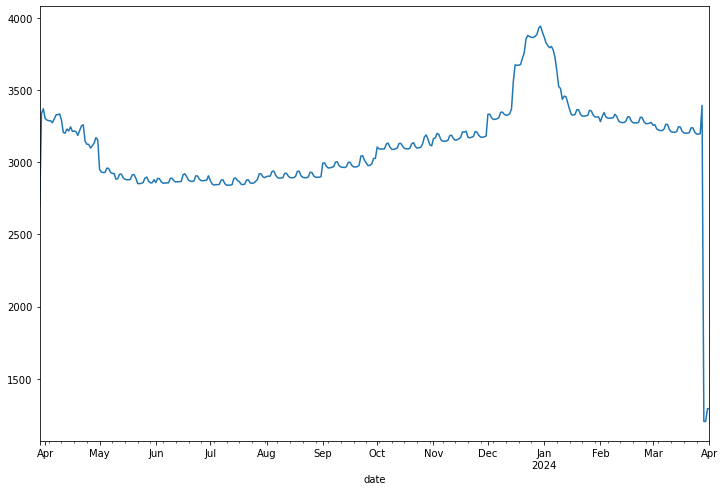

In [47]:
#VISUAL
calendar['adjusted_price'].groupby(calendar['date']).mean().plot(figsize=(12, 8))

The purpose of this code is to split the data in the 'calendar' DataFrame 
into two separate DataFrames based on the availability status indicated by 
the 'available' column. The available_df DataFrame will contain rows where 
the 'available' column is 't' (indicating availability), and the 
not_available_df DataFrame will contain rows where the 'available' column is 'f' 
(indicating unavailability).

In [48]:
available_df = calendar[calendar['available'] == 't']
not_available_df = calendar[calendar['available'] == 'f']

In [49]:
available_df['adjusted_price'].mean() - not_available_df['adjusted_price'].mean()

167.64743740900713

The following code executes two line plots in the same figure. 
The first plot represents the average adjusted price over time for available listings,
and the second plot represents the average adjusted price over time for not available listings.
This visualization can help analyze and compare the trends and patterns of the adjusted prices for available and not available listings over time.

<AxesSubplot:xlabel='date'>

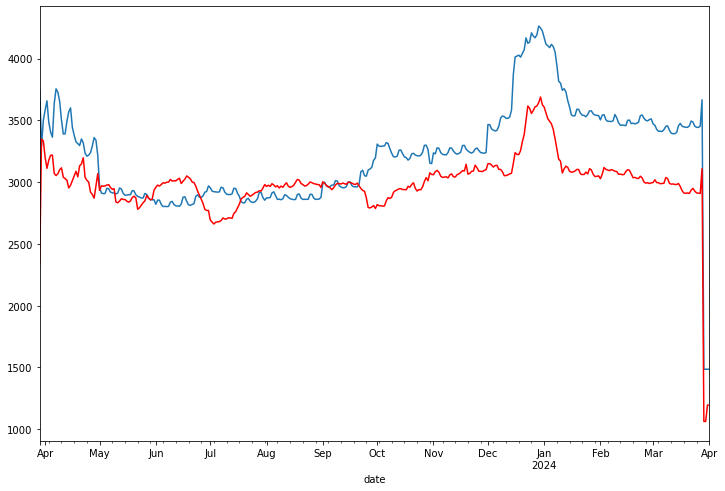

In [50]:
#VISUAL
available_df['adjusted_price'].groupby(available_df['date']).mean().plot(figsize=(12, 8))
not_available_df['adjusted_price'].groupby(not_available_df['date']).mean().plot(figsize=(12, 8),
                                                                                color='red')

In [51]:
# I apply the 'remove_dollar' function at the 'price' column of the listings DF.
listings['price'] = listings['price'].apply(remove_dollar)

The standard deviation (std) is 14521 and the mean is 3292,
so we havee to examine if the values in the dataset have a large spread or 
variability around the mean or outliers.

In [52]:
listings['price'].describe()

count     19751.000000
mean       3292.699306
std       14521.635420
min         154.000000
25%         850.000000
50%        1400.000000
75%        2736.000000
max      800880.000000
Name: price, dtype: float64

<AxesSubplot:>

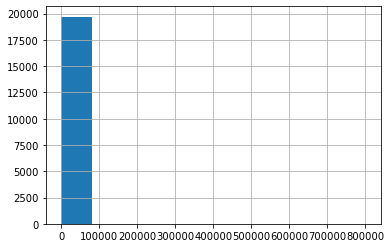

In [53]:
listings['price'].hist()

With the following code, I can identify and remove potential outliers in the 'price' column 
using the IQR rule and visualize the updated distribution using a box plot.

<AxesSubplot:xlabel='price'>

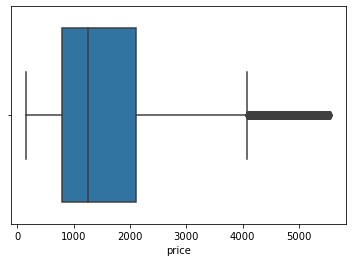

In [54]:
#VISUAL

# Work out Interquartile range on price - using 1.5 IQR rule
Q1_price = listings['price'].quantile(0.25) #calculates the first quartile (Q1) value for the 'price' column, representing the 25th percentile of the data.
Q3_price = listings['price'].quantile(0.75) #calculates the third quartile (Q3) value for the 'price' column, representing the 75th percentile of the data.
IQR_price = Q3_price - Q1_price #This line calculates the interquartile range (IQR) by subtracting Q1 from Q3. The IQR represents the range of values that span the middle 50% of the data.
lowerRange = Q1_price - (1.5 * IQR_price) #calculates the lower threshold for outlier detection using the IQR rule. It subtracts 1.5 times the IQR from Q1.
upperRange = Q3_price + (1.5 * IQR_price) #calculates the upper threshold for outlier detection using the IQR rule. It adds 1.5 times the IQR to Q3.

# Removing rows where price deemed as outlier given IQR
listings = listings.copy() #This line creates a copy of the 'listings' DataFrame
listings.drop(listings[(listings.price > upperRange) | (listings.price < lowerRange)].index, inplace=True) #removes rows from the 'listings' DataFrame where the 'price' values are considered outliers based on the IQR rule. Rows with prices above the upperRange or below the lowerRange are dropped.

# Take another look at the price column
sns.boxplot(x = listings['price'])

The standard deviation (std) is now 1170 and the mean is 1644, that means that the values 
in the dataset have a moderate spread or variability around the mean.

In [55]:
listings['price'].describe()

count    17695.000000
mean      1644.683357
std       1170.020212
min        154.000000
25%        800.000000
50%       1250.000000
75%       2114.000000
max       5557.000000
Name: price, dtype: float64

<AxesSubplot:>

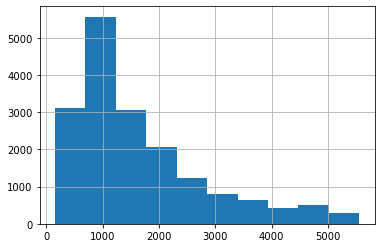

In [56]:
#VISUAL
listings['price'].hist()

The following code prints a Pandas Series where the index represents 
the unique values in the 'room_type' column, and the corresponding values represent 
the relative frequencies of each value.<br>
As we can see there are 4 distinct room types:<br>
<br>
Entire home/apt    78.1%<br>
Private room       20.6%<br>
Hotel room         0.09%<br>
Shared room        0.05%<br>

In [57]:
# What is the breakdown of the listings by room type / property types ?
listings['room_type'].value_counts() / (listings.shape[0] - sum(listings['room_type'].isnull()))

Entire home/apt    0.781068
Private room       0.205651
Hotel room         0.008703
Shared room        0.004578
Name: room_type, dtype: float64

Creating box plots to compare the distribution of prices among different room types 
in the 'listings' DataFrame.

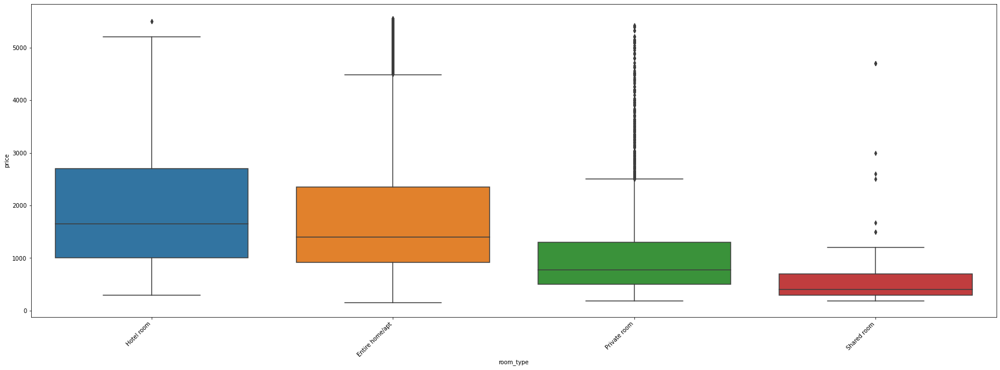

In [58]:
#VISUAL

# Room Type vs Price
plt.figure(figsize=(30,10))
sort_price = listings\
                    .groupby('room_type')['price']\
                    .median()\
                    .sort_values(ascending=False)\
                    .index
sns.boxplot(y='price', x='room_type', data=listings, order=sort_price)
ax = plt.gca()
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.show();

By executing this code, I will obtain a DataFrame with the top 10 property types 
based on their counts in the 'listings' DataFrame. 
The 'id' column represents the count of listings for each property type.
As we can see the Entore rental unit is by far the most popular property type in Cape Town.<br>
<br>
Entire rental unit	6861,<br>
Entire home	2725,<br>
Private room in home	1264,<br>
Entire condo	1035,<br>
Entire guest suite	1022,<br>
Private room in guesthouse	552,<br>
Private room in rental unit	540,<br>
Entire serviced apartment	452,<br>
Entire guesthouse	396,<br>
Private room in bed and breakfast	362<br>

In [59]:

listings.groupby(by='property_type').count()[['id']].sort_values(by='id', ascending=False).head(10)

,id
property_type,
Entire rental unit,6861
Entire home,2725
Private room in home,1264
Entire condo,1035
Entire guest suite,1022
Private room in guesthouse,552
Private room in rental unit,540
Entire serviced apartment,452
Entire guesthouse,396


By executing this code, I will obtain box plots to compare the distribution 
of prices for different property types in the 'listings' DataFrame.

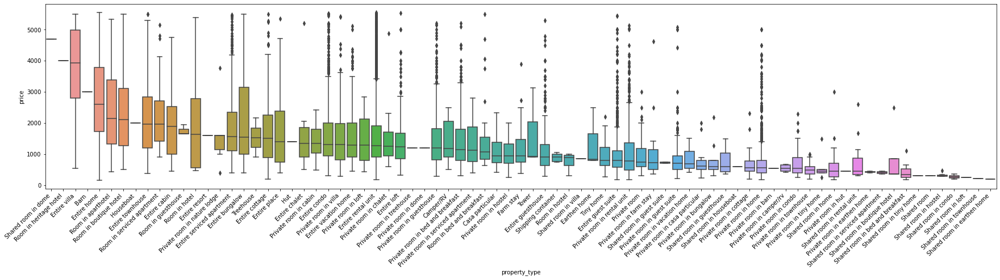

In [60]:
#VISUAL

# Property Type by Price
plt.figure(figsize=(30,6))
sort_price = listings\
                    .groupby('property_type')['price']\
                    .median()\
                    .sort_values(ascending=False)\
                    .index
sns.boxplot(y='price', x='property_type', data=listings, order=sort_price)
ax = plt.gca()
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.show();

By executing this code, I will obtain box plots to compare the distribution of prices for different neighborhoods in the 'listings' DataFrame.

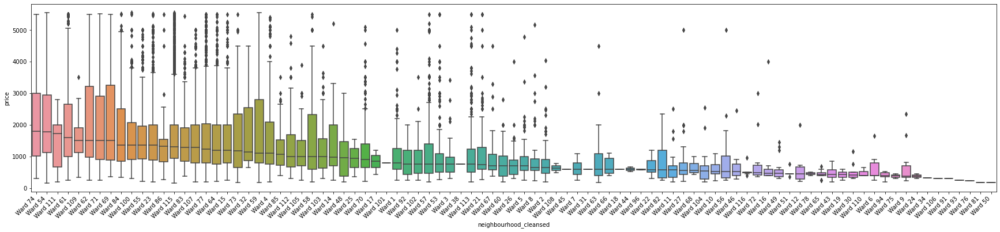

In [61]:
#VISUAL

# Neighbourhood vs Price
plt.figure(figsize=(30,6))
sort_price = listings.groupby('neighbourhood_cleansed')['price']\
                    .median()\
                    .sort_values(ascending=False)\
                    .index
sns.boxplot(y='price', x='neighbourhood_cleansed', data=listings, 
            order=sort_price)
ax = plt.gca()
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.show();

In [62]:
# The function 'get_listing_mean' takes a numerical integer listing_id as input 
# and returns the mean value of the 'adjusted_price' column for the corresponding 
# listing in the 'calendar' DataFrame

def get_listing_mean(listing_id):

    return calendar[calendar['listing_id'] == listing_id]['adjusted_price'].mean()

# The function 'get_listing_min' takes a numerical integer listing_id as input 
# and returns the min value of the 'adjusted_price' column for the corresponding 
# listing in the 'calendar' DataFrame

def get_listing_min(listing_id):
    
    return calendar[calendar['listing_id'] == listing_id]['adjusted_price'].min()

# The function 'get_listing_max' takes a numerical integer listing_id as input 
# and returns the max value of the 'adjusted_price' column for the corresponding 
# listing in the 'calendar' DataFrame

def get_listing_max(listing_id):
    
    return calendar[calendar['listing_id'] == listing_id]['adjusted_price'].max()

After executing this code, I will have a DataFrame called price_df with two columns:
'listing_id' and 'days_available'. Each row in the DataFrame represents a unique 
listing ID from the 'calendar' DataFrame, and the 'days_available' column indicates 
the count of available days for each listing. And below i will use the functions i created for.

In [63]:
price_df = calendar['listing_id'].value_counts().reset_index()
price_df.columns = ['listing_id', 'days_available']

price_df

,listing_id,days_available
0,1048451,365
1,588733890655158056,365
2,589584206337092623,365
3,589504007901142568,365
4,589012355280981612,365
...,...,...
19734,32803880,365
19735,32802394,365
19736,32801881,365
19737,1942398,365


Now, I have a new insightful price_df dataset that i can use later, knowing the min, max and mean price each unique listing had the last 12 months.

In [64]:
price_df['mean_price'] = price_df['listing_id'].apply(get_listing_mean)

price_df['min_price'] = price_df['listing_id'].apply(get_listing_min)

price_df['max_price'] = price_df['listing_id'].apply(get_listing_max)

price_df.drop('days_available', axis=1, inplace=True)

price_df

,listing_id,mean_price,min_price,max_price
0,1048451,1341.000000,1341.0,1341.0
1,588733890655158056,1647.534247,1450.0,2800.0
2,589584206337092623,3099.484932,1606.0,7140.0
3,589504007901142568,2952.635616,2798.0,4000.0
4,589012355280981612,730.000000,730.0,730.0
...,...,...,...,...
19734,32803880,789.342466,590.0,890.0
19735,32802394,550.000000,550.0,550.0
19736,32801881,27561.643836,26000.0,45000.0
19737,1942398,8775.000000,8775.0,8775.0


The following code merges the listingd_df with the price_df in otder to use the final df DataFrame to the correlation matrix I will create.

In [65]:
df = pd.merge(listings_df, price_df, left_on='id', right_on='listing_id')
df.dropna(how='all', axis=1, inplace=True)

df.columns

Index(['last_scraped', 'minimum_minimum_nights', 'id', 'availability_365',
       'reviews_per_month', 'instant_bookable',
       'calculated_host_listings_count', 'beds', 'availability_60',
       'number_of_reviews', 'calculated_host_listings_count_shared_rooms',
       'review_scores_communication', 'host_has_profile_pic',
       'host_verifications', 'calculated_host_listings_count_entire_homes',
       'host_identity_verified', 'accommodates', 'latitude', 'longitude',
       'scrape_id', 'number_of_reviews_l30d', 'maximum_minimum_nights',
       'calculated_host_listings_count_private_rooms',
       'review_scores_location', 'availability_30', 'review_scores_accuracy',
       'calendar_last_scraped', 'source', 'has_availability',
       'review_scores_value', 'review_scores_rating', 'host_is_superhost',
       'minimum_nights', 'number_of_reviews_ltm', 'host_listings_count',
       'neighbourhood', 'availability_90', 'minimum_nights_avg_ntm',
       'review_scores_cleanliness', 'b

The given code calculates the correlation between the 'mean_price' column and all other columns in the DataFrame df. It then performs several operations to sort and format the correlation results.

In [66]:
corr_df = df.corr().sort_values('mean_price', ascending=False)['mean_price'].reset_index()
corr_df.columns = ['feature', 'corr']
corr_df['corr_abs'] = corr_df['corr'].abs()

In [67]:
corr_df = corr_df.sort_values('corr_abs', ascending=False).head(20)

In [68]:
# This line defines a dictionary called ''format_dict` that specifies formatting patterns 
# for different data types. It provides formats for 'sum' (currency format with no decimal 
# places), 'date' (month-year format), and 'pct_of_total' (percentage format with two decimal 
# places).
format_dict = {'sum':'${0:,.0f}', 'date': '{:%m-%Y}', 'pct_of_total': '{:.2%}'}

The chained methods in the below code build upon each other to customize the formatting, style, and appearance of the DataFrame. The resulting styled DataFrame will have the specified formatting, hidden index column, bar chart visualization for the 'corr_abs' column.

In [69]:
(corr_df
 .style
 .format(format_dict)
 .hide_index()
 .bar(color='lightgreen', subset=['corr_abs'], align='zero')
 .set_caption('Biggest correlations with listings price'))

feature,corr,corr_abs
mean_price,1.000000,1.000000
min_price,0.976167,0.976167
max_price,0.561325,0.561325
accommodates,0.363317,0.363317
bedrooms,0.324169,0.324169
beds,0.268683,0.268683
longitude,-0.104047,0.104047
number_of_reviews_ltm,-0.068264,0.068264
number_of_reviews_l30d,-0.065844,0.065844
number_of_reviews,-0.062406,0.062406


The resulting heatmap visualizes the correlation values between the columns of the DataFrame df. Higher positive values are represented by deep blue colours, while higher negative values are represented by brighter yellow colors. The color palette used in this case is the Yellow-Blue palette. As we can observe, price is affected from accomodates, bedrooms and overall beds and that is something we expected.

<AxesSubplot:>

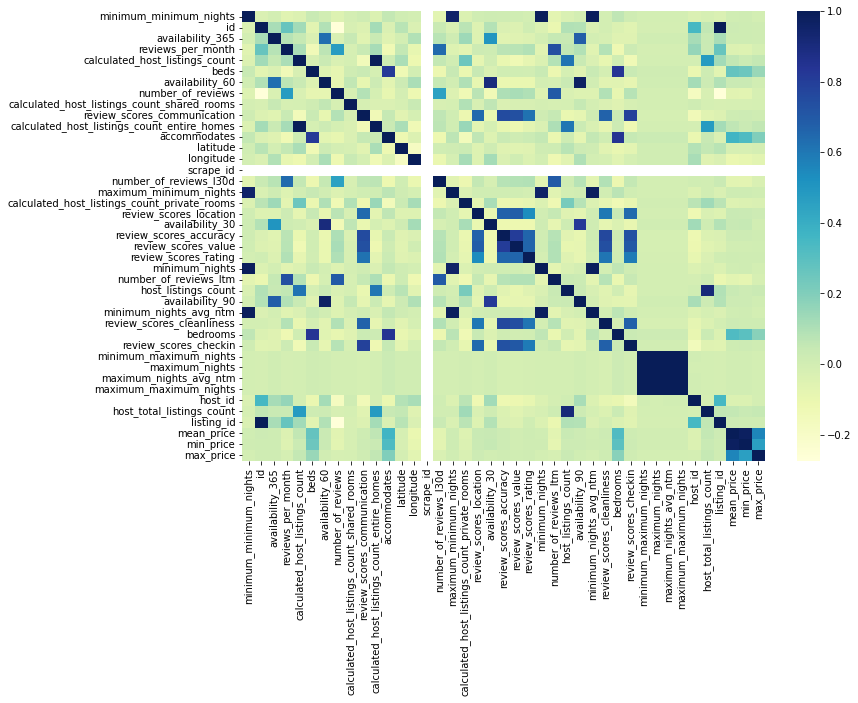

In [70]:
#VISUAL

fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.heatmap(df.corr(), cmap="YlGnBu", ax=ax)

The resulting DataFrame will display the neighborhood, mean price, accommodation capacity, number of bedrooms, and listing ID for the top 10 listings with the lowest mean prices in ascending order.

In [71]:
df.sort_values('mean_price', ascending=True)[['neighbourhood_cleansed',
                                               'mean_price',
                                               'accommodates',
                                               'bedrooms',
                                               'listing_id'
                                              ]].head(10)

,neighbourhood_cleansed,mean_price,accommodates,bedrooms,listing_id
4672,Ward 59,180.000000,1,1.00000,20771990
7796,Ward 11,181.315068,1,1.00000,33738120
9288,Ward 107,185.000000,1,1.00000,40296959
5171,Ward 43,187.791781,6,1.98624,21697627
8759,Ward 2,188.000000,2,1.00000,38443822
14841,Ward 104,190.000000,1,1.00000,635873702223892312
4568,Ward 11,195.000000,1,1.00000,19709766
8700,Ward 81,199.397260,1,1.00000,38683795
13341,Ward 115,200.000000,1,1.00000,53694527
10169,Ward 115,200.000000,8,1.00000,42902780


The resulting DataFrame will display the neighborhood, mean price, accommodation capacity, number of bedrooms, and listing ID for the top 10 listings with the highest mean prices in descending order.

In [72]:
df.sort_values('mean_price', ascending=False)[['neighbourhood_cleansed',
                                               'mean_price',
                                               'accommodates',
                                               'bedrooms',
                                               'listing_id'
                                              ]].head(10)

,neighbourhood_cleansed,mean_price,accommodates,bedrooms,listing_id
18757,Ward 74,728441.000000,5,1.00000,812768516475697547
15489,Ward 54,300000.000000,12,6.00000,684763757047711680
14042,Ward 54,300000.000000,12,6.00000,577895795258232952
15605,Ward 54,189123.287671,10,5.00000,679531837863599355
7756,Ward 115,156141.000000,8,4.00000,33636133
11165,Ward 100,155364.000000,1,1.98624,47299433
15601,Ward 54,147178.082192,10,5.00000,679530471741841459
6105,Ward 54,144808.219178,12,6.00000,24230850
6111,Ward 54,143835.616438,10,6.00000,24231503
6769,Ward 54,133380.821918,10,5.00000,29391240


I defined afunction called get_ward_mean that takes a ward_name as input and returns the mean price of listings in that particular ward.

In [73]:
def get_ward_mean(ward_name):
    
    return df[df['neighbourhood_cleansed'] == ward_name]['mean_price'].mean()

The following code adds a new column called 'ward_mean' to the DataFrame df. The values in this column are calculated by applying the get_ward_mean function to each value in the 'neighbourhood_cleansed' column.

In [74]:
df['ward_mean'] = df['neighbourhood_cleansed'].apply(get_ward_mean)

The code below creates a new DataFrame called ward_mean_df that contains two columns: 'ward' and 'ward_mean'. This DataFrame represents the unique wards and their corresponding mean prices from the original DataFrame df.

In [75]:
ward_mean_df = df[['neighbourhood_cleansed', 'ward_mean']]
ward_mean_df.columns = ['ward', 'ward_mean']
ward_mean_df.drop_duplicates(subset='ward', inplace=True)
ward_mean_df

/Users/levantisgio/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,ward,ward_mean
0,Ward 57,1168.021693
1,Ward 107,1718.874326
2,Ward 23,2149.005127
3,Ward 115,2337.228848
4,Ward 4,2701.539511
...,...,...
11052,Ward 22,720.649706
12370,Ward 18,590.000000
14925,Ward 78,450.438356
18229,Ward 34,320.000000


In [76]:
ward_geo

,neighbourhood,neighbourhood_group,geometry
0,Ward 86,NaN,"MULTIPOLYGON (((18.87634 -34.11744, 18.87253 -..."
1,Ward 94,NaN,"MULTIPOLYGON (((18.68509 -34.04335, 18.68503 -..."
2,Ward 85,NaN,"MULTIPOLYGON (((18.85646 -34.10521, 18.85672 -..."
3,Ward 98,NaN,"MULTIPOLYGON (((18.68398 -34.05470, 18.68422 -..."
4,Ward 83,NaN,"MULTIPOLYGON (((18.85646 -34.10521, 18.85623 -..."
...,...,...,...
111,Ward 27,NaN,"MULTIPOLYGON (((18.55346 -33.89038, 18.55701 -..."
112,Ward 23,NaN,"MULTIPOLYGON (((18.51017 -33.72127, 18.51108 -..."
113,Ward 105,NaN,"MULTIPOLYGON (((18.76781 -33.82659, 18.76640 -..."
114,Ward 32,NaN,"MULTIPOLYGON (((18.61060 -33.58508, 18.61060 -..."


After executing this code, the wards DataFrame will contain the merged information from ward_geo and ward_mean_df, excluding the 'neighbourhood_group' and 'neighbourhood' columns.<br> The resulting DataFrame will represent the wards, their corresponding geographical information, and the mean prices associated with each ward in order to visualize it with Folium.

In [77]:
wards = pd.merge(ward_geo, ward_mean_df,
                 left_on='neighbourhood',
                right_on='ward')

wards.drop(['neighbourhood_group', 'neighbourhood'], axis=1, inplace=True)

In [78]:
wards = wards.sort_values('ward_mean', ascending=False)
wards


,geometry,ward,ward_mean
84,"MULTIPOLYGON (((18.39274 -33.90819, 18.39332 -...",Ward 54,7072.760144
82,"MULTIPOLYGON (((18.47256 -34.00249, 18.47223 -...",Ward 62,6762.761379
79,"MULTIPOLYGON (((18.40632 -34.00981, 18.40578 -...",Ward 74,4903.272074
78,"MULTIPOLYGON (((18.40305 -34.01977, 18.40402 -...",Ward 71,3687.150927
76,"MULTIPOLYGON (((18.41533 -34.11552, 18.41533 -...",Ward 69,3417.129197
...,...,...,...
23,"MULTIPOLYGON (((18.63896 -33.97624, 18.63905 -...",Ward 106,303.643836
10,"MULTIPOLYGON (((18.66611 -34.02361, 18.66644 -...",Ward 91,300.000000
33,"MULTIPOLYGON (((18.56230 -33.94563, 18.56189 -...",Ward 50,294.219178
9,"MULTIPOLYGON (((18.70047 -34.03015, 18.69801 -...",Ward 93,253.589041


This line creates a new Folium map object using the folium.Map() constructor. The location parameter specifies the latitude and longitude coordinates of the Cape Town, South Africa.

In [79]:
cape_town_coords = [-33.9249, 18.4241]
CapeTown_map = folium.Map(location=cape_town_coords,zoom_start=9.6)
CapeTown_map

In [80]:
from folium import plugins

# create a marker cluster object for the restaurants
apartments = plugins.MarkerCluster().add_to(CapeTown_map)

# add each restaurant to the restaurants marker cluster
for lat, lng in zip(listings.latitude, listings.longitude):
    folium.Marker(
        location=[lat, lng],
        icon=None,
    ).add_to(apartments)

# display the map
CapeTown_map

After executing this code, the folium_map will display the Choropleth layer representing the wards colored based on their mean prices, with each ward's boundaries outlined and filled accordingly.

In [81]:
# Add colour fill for municipality boundaries layer

folium.Choropleth(
    geo_data=ward_geo,
    data=wards,
    columns=['ward', 'ward_mean'],
    key_on= 'properties.neighbourhood',
    fill_color='RdYlBu',
    line_opacity=0.2,
    nan_fill_color='#ff845e'
).add_to(CapeTown_map)

In [82]:
#VISUAL

CapeTown_map

As we observe, 17.695 unique listings in Cape Town. It is likely that apartments located on the Cape Town peninsula have higher average values compared to those located centrally away from the sea. We can also notice that most of the apartments in Cape Town are located close to the sea.

One potential factor contributing to this trend could be the scenic coastal views offered by the Cape Town peninsula. The presence of breathtaking views of the Atlantic Ocean and the majestic Table Mountain in the backdrop adds significant value to properties. These scenic attributes are highly desirable, leading to increased demand and subsequently driving up prices.

Another possible factor is the limited supply of properties on the peninsula. Geographical constraints and zoning regulations may restrict the availability of land for development. With a limited number of properties in such a desirable location, the demand outweighs the supply, creating a competitive market and driving prices higher.